In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from ALLCools.plot import *

In [123]:
cluster = np.load('cell_4176_L5ET_knn30_res1.6_15cluster_label.npy')
cluster = pd.Series(cluster, index=[f'RS2_{i}' for i in range(cluster.size)])

In [2]:
cell_class_palette = pd.read_csv('/home/hanliu/project/mouse_rostral_brain/metadata/palette/cell_class.palette.csv',
                                header=None, index_col=0, squeeze=True).to_dict()
major_type_palette = pd.read_csv('/home/hanliu/project/mouse_rostral_brain/metadata/palette/major_type.palette.csv',
                                header=None, index_col=0, squeeze=True).to_dict()
sub_type_palette = pd.read_csv('/home/hanliu/project/mouse_rostral_brain/metadata/palette/sub_type.palette.csv',
                                header=None, index_col=0, squeeze=True).to_dict()
region_palette = pd.read_csv('/home/hanliu/project/mouse_rostral_brain/metadata/palette/dissection_region.palette.csv',
                                header=None, index_col=0, squeeze=True).to_dict()
sub_region_palette = pd.read_csv('/home/hanliu/project/mouse_rostral_brain/metadata/palette/sub_region.palette.csv',
                                header=None, index_col=0, squeeze=True).to_dict()
major_region_palette = pd.read_csv('/home/hanliu/project/mouse_rostral_brain/metadata/palette/major_region.palette.csv',
                                header=None, index_col=0, squeeze=True).to_dict()


In [124]:
mc_tidy_data = pd.read_msgpack(
    '/home/hanliu/project/mouse_rostral_brain/study/ClusteringSummary/Summary/TotalClusteringResults.msg'
)
mc_inte_data = pd.read_hdf(
    '/home/hanliu/project/mouse_rostral_brain/study/L5-PT_Integrate_with_RS2/RS2/RS1.integrate_tidy_data.hdf'
)
mc_tidy_data = pd.concat([mc_tidy_data.loc[mc_inte_data.index], mc_inte_data], axis=1)
mc_tidy_data = mc_tidy_data[mc_tidy_data['SubType'].apply(lambda i: 'Outlier' not in i)].copy()

/home/hanliu/miniconda3/envs/clustering/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3326: FutureWarning: The read_msgpack is deprecated and will be removed in a future version.
It is recommended to use pyarrow for on-the-wire transmission of pandas objects.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [125]:
rs2_tidy_data = pd.read_hdf(
    '/home/hanliu/project/mouse_rostral_brain/study/L5-PT_Integrate_with_RS2/RS2/RS2_PT_tidy_data_with_integration.hdf'
)
rs2_tidy_data['SubType'] = cluster
rs2_tidy_data.head()


,source,slice,target,gender,cluster,non-clonal reads,leiden,rs1rs2umap_0,rs1rs2umap_1,rs1rs2tsne_0,rs1rs2tsne_1,SubType
RS2_0,MOp,3C,SC,male,L5-ET,1090870,0,1.010182,-6.630608,-8.897109,-26.780367,0
RS2_1,MOp,3C,SC,female,L5-ET,1458065,10,-4.465032,3.493340,33.079362,-10.542924,1
RS2_10,MOp,3C,SC,female,L5-ET,1354285,1,-5.217080,-0.103142,20.938636,-25.717418,4
RS2_100,MOp,3C,SC,male,L5-ET,1352327,0,1.785158,-7.465015,-10.831601,-32.349014,0
RS2_1000,SSp,6B,Pons,female,L5-ET,907061,2,-2.194648,-1.872664,-12.202137,-6.324511,5


In [49]:
target_palette = {
    'SC': '#e28080',
    'Pons': '#e27731',
    'STR': '#adb834',
    'SSp': '#2ca02c',
    'ACA': '#8c564b',
    'TH': '#5d6ace',
    'VISp': '#e24383',
    'MY': '#4ab8d2',
    'MB': '#347f52',
    'MOp': '#176CDB'
}

In [50]:
source_palette = {
    'MOp': '#176CDB',
    'SSp': '#2ca02c',
    'VISp': '#e24383',
    'ACA': '#8c564b',
    'AI': '#A6D634',
    'AUDp': '#9857ca',
    'RSP': '#4ab8d2',
    'PTLp': '#e27731'
}

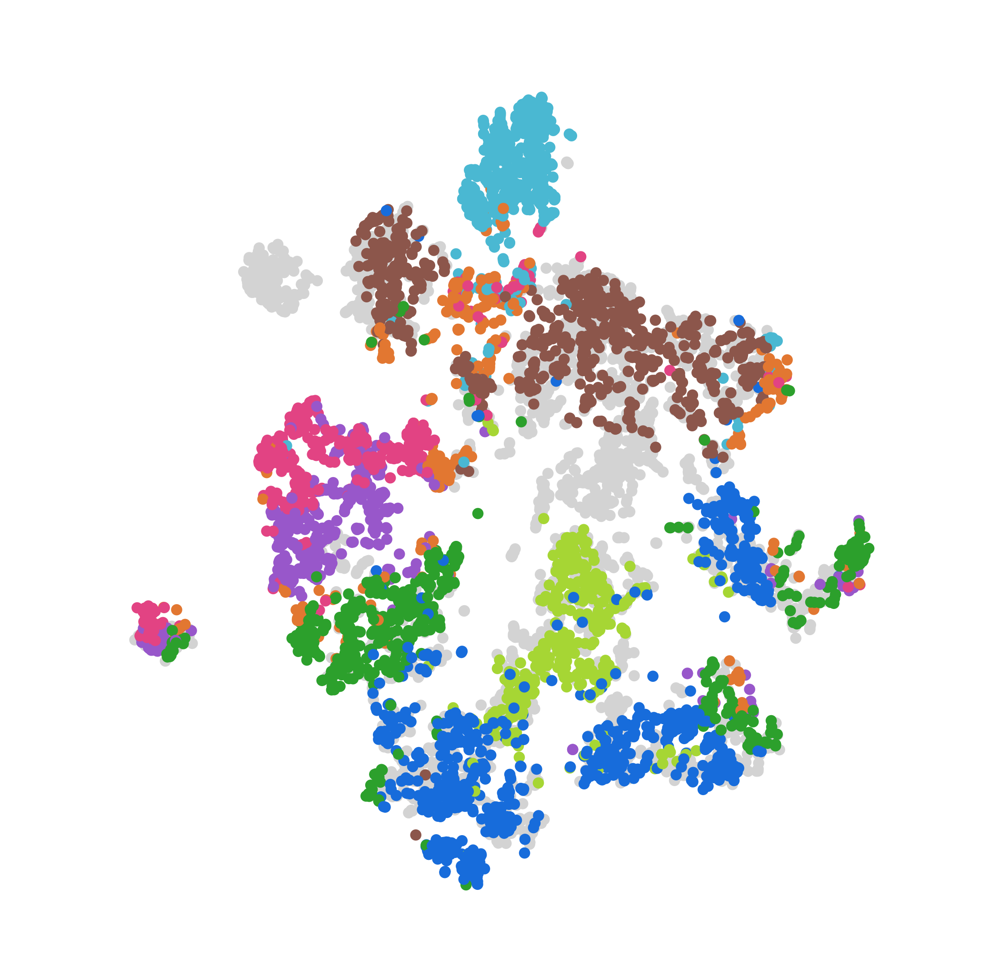

In [76]:
fig, ax = plt.subplots(figsize=(2, 2), dpi=1200)

categorical_scatter(ax=ax, data=mc_tidy_data, coord_base='rs1rs2tsne', 
                    hue=None, scatter_kws=dict(color='lightgray'),
                    max_points=None, s=2, axis_format=None)

categorical_scatter(ax=ax, data=rs2_tidy_data, coord_base='rs1rs2tsne', 
                    hue='source', palette=source_palette, #show_legend=True,
                    max_points=None, s=2, axis_format=None)
fig.savefig(f'RS2.source.png')

pass

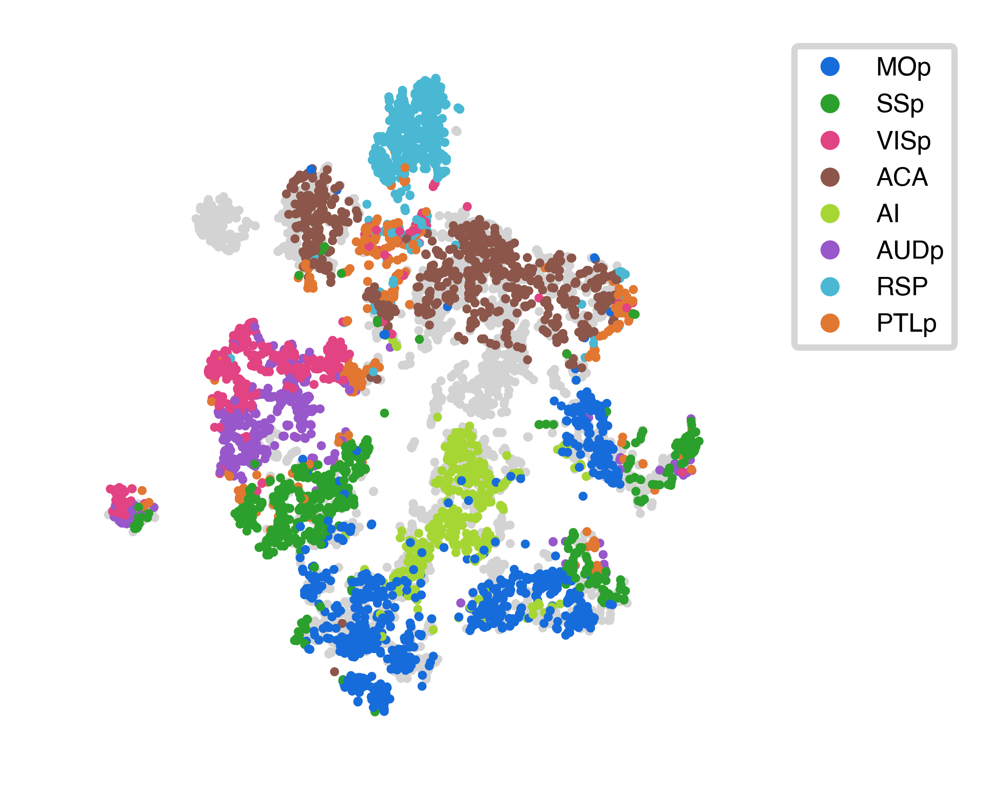

In [128]:
fig, ax = plt.subplots(figsize=(2, 2), dpi=1200)

categorical_scatter(ax=ax, data=mc_tidy_data, coord_base='rs1rs2tsne', 
                    hue=None, scatter_kws=dict(color='lightgray'),
                    max_points=None, s=2, axis_format=None)

categorical_scatter(ax=ax, data=rs2_tidy_data, coord_base='rs1rs2tsne', 
                    hue='source', palette=source_palette, show_legend=True,
                    max_points=None, s=2, axis_format=None)
fig.savefig(f'RS2.source.pdf')

pass

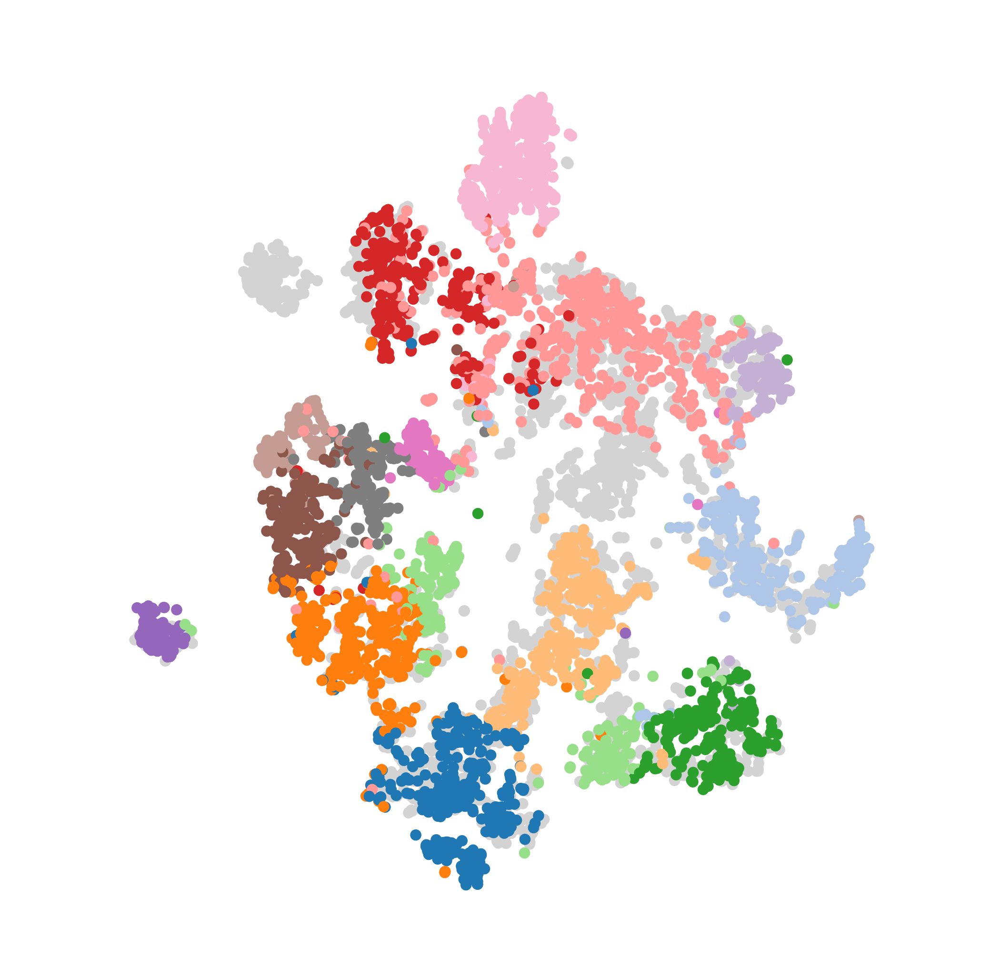

In [126]:
fig, ax = plt.subplots(figsize=(2, 2), dpi=1200)

categorical_scatter(ax=ax, data=mc_tidy_data, coord_base='rs1rs2tsne', 
                    hue=None, scatter_kws=dict(color='lightgray'),
                    max_points=None, s=2, axis_format=None)

categorical_scatter(ax=ax, data=rs2_tidy_data, coord_base='rs1rs2tsne', 
                    hue='SubType', palette='tab20', #show_legend=True,
                    max_points=None, s=2, axis_format=None)
fig.savefig(f'RS2.subtype.png')

pass

In [92]:
rs1_use_cell = mc_tidy_data['SubRegion'].isin(['MOs', 'MOp', 
                                'AI', 'ACA', 'SSp', 'SSs'])
rs2_use_cell = rs2_tidy_data['source'].isin(['MOs', 'MOp', 
                                'AI', 'ACA', 'SSp', 'SSs'])

In [97]:
rs1_use_cell.sum(), rs2_use_cell.sum()

(1749, 2421)

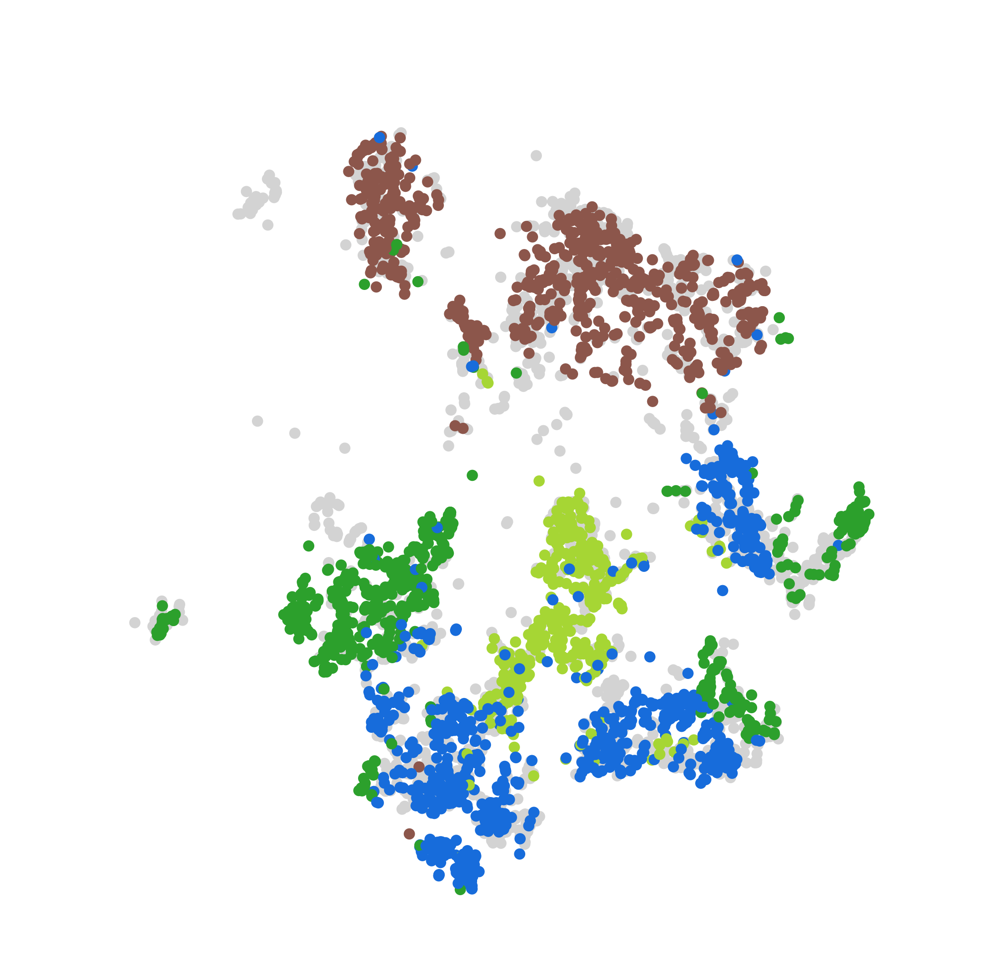

In [95]:
fig, ax = plt.subplots(figsize=(2, 2), dpi=1200)

categorical_scatter(ax=ax, data=mc_tidy_data.loc[rs1_use_cell], coord_base='rs1rs2tsne', 
                    hue=None, scatter_kws=dict(color='lightgray'),
                    max_points=None, s=2, axis_format=None)

categorical_scatter(ax=ax, data=rs2_tidy_data.loc[rs2_use_cell], coord_base='rs1rs2tsne', 
                    hue='source', palette=source_palette, #show_legend=True,
                    max_points=None, s=2, axis_format=None)
fig.savefig(f'RS2.source.only_both.png')

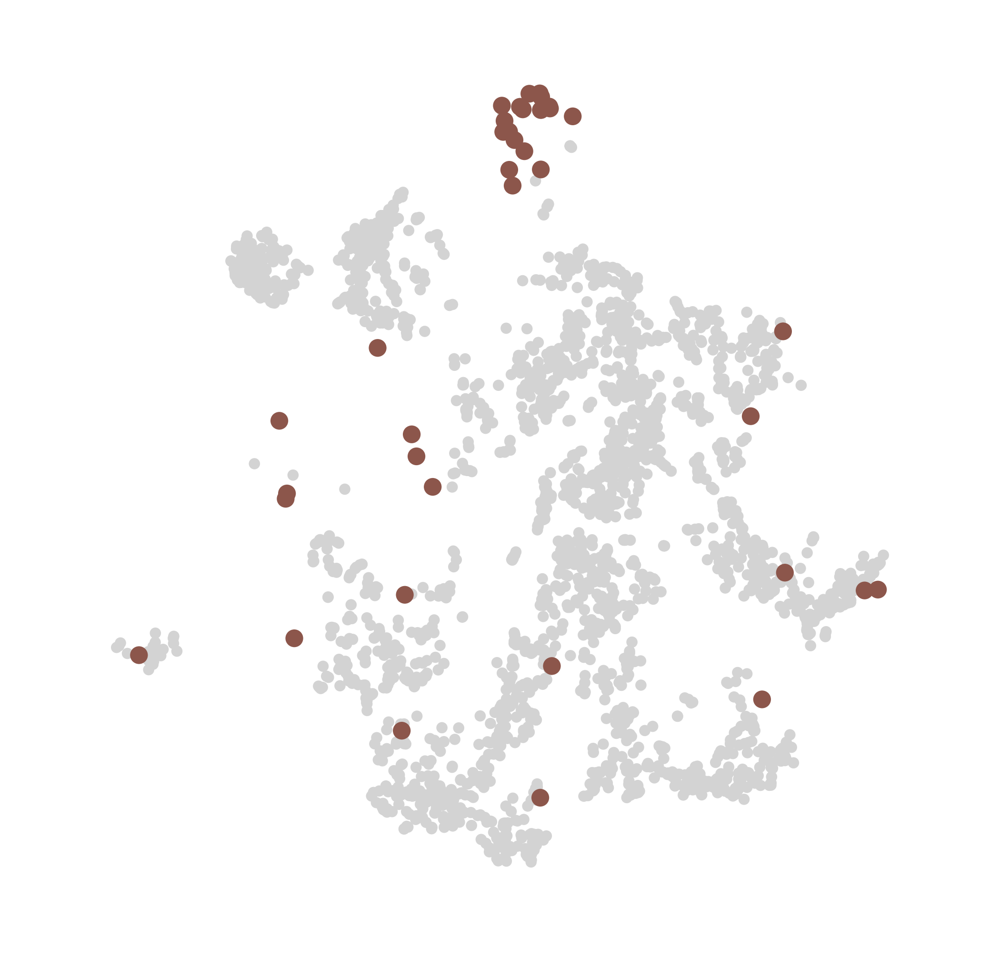

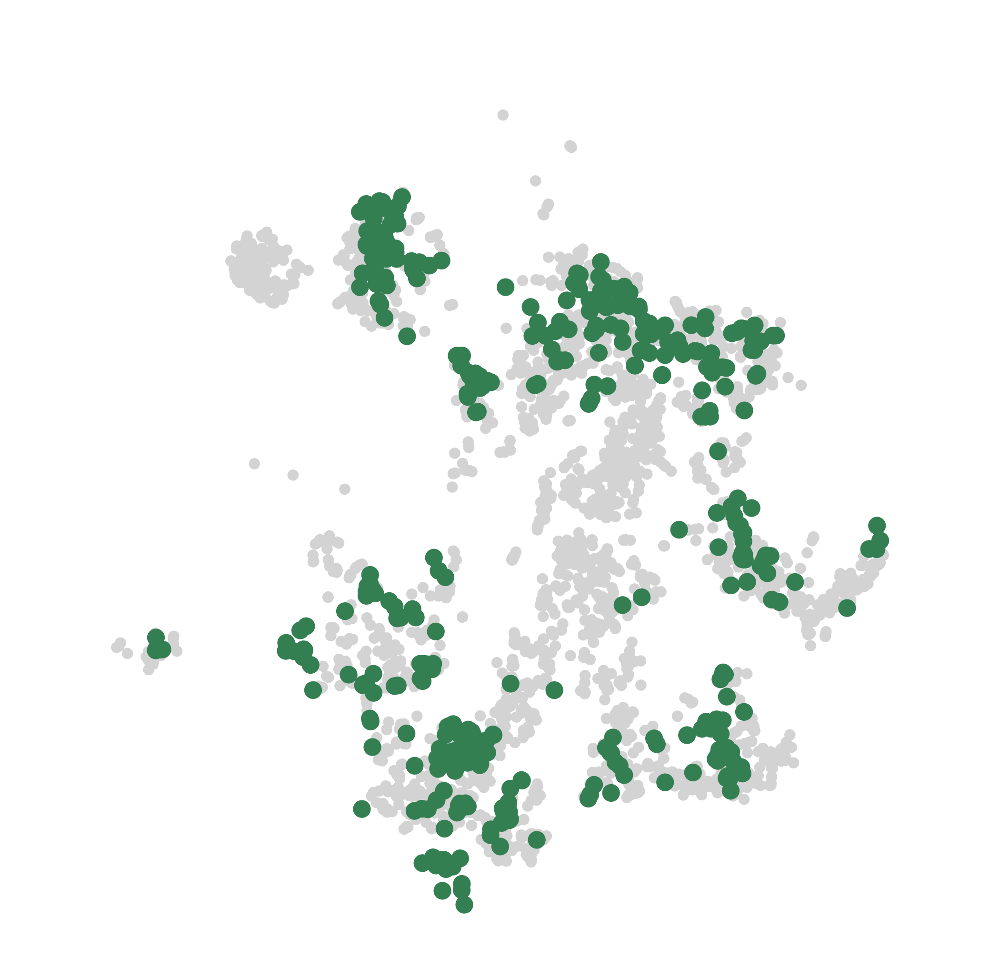

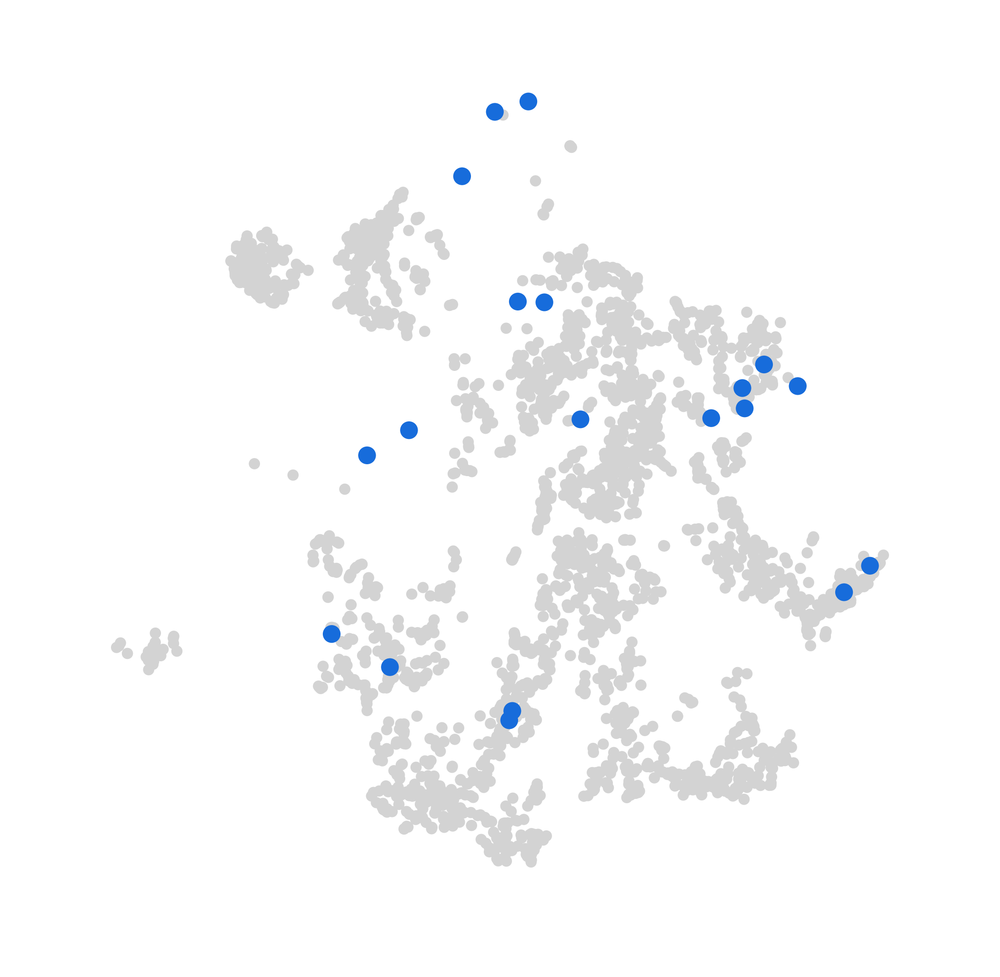

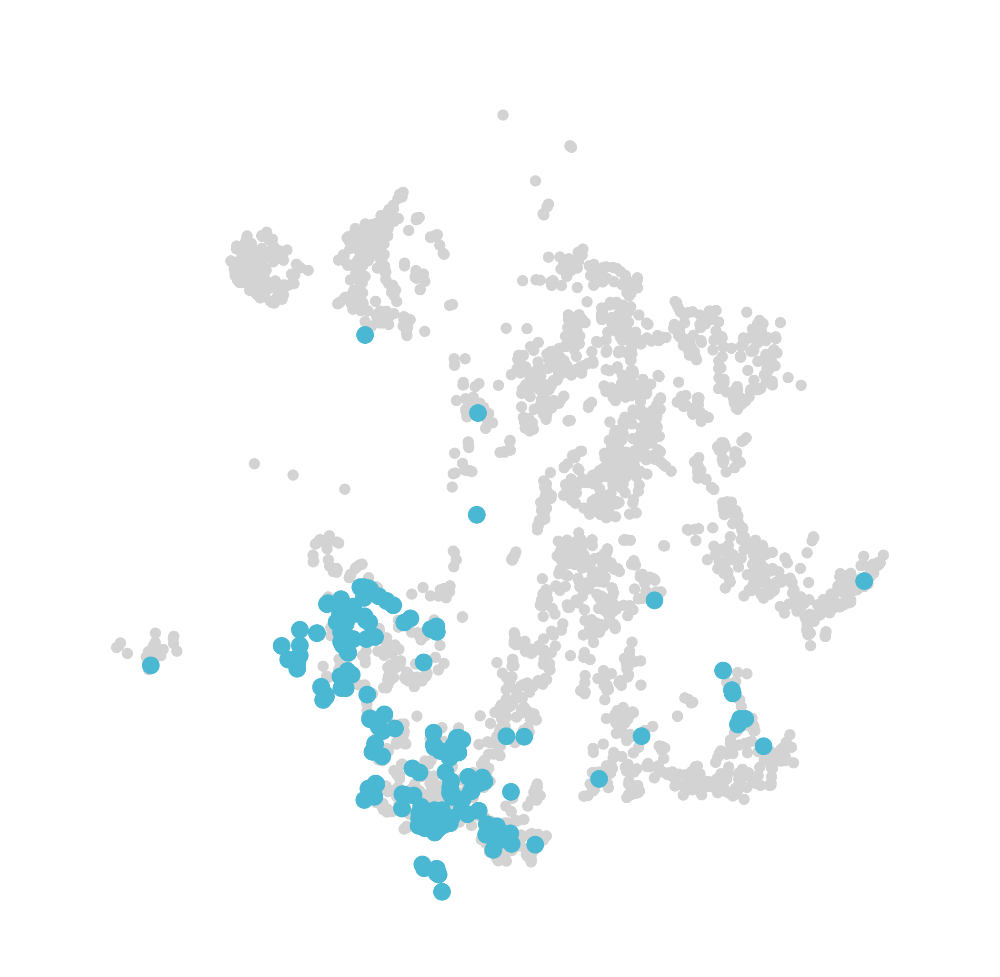

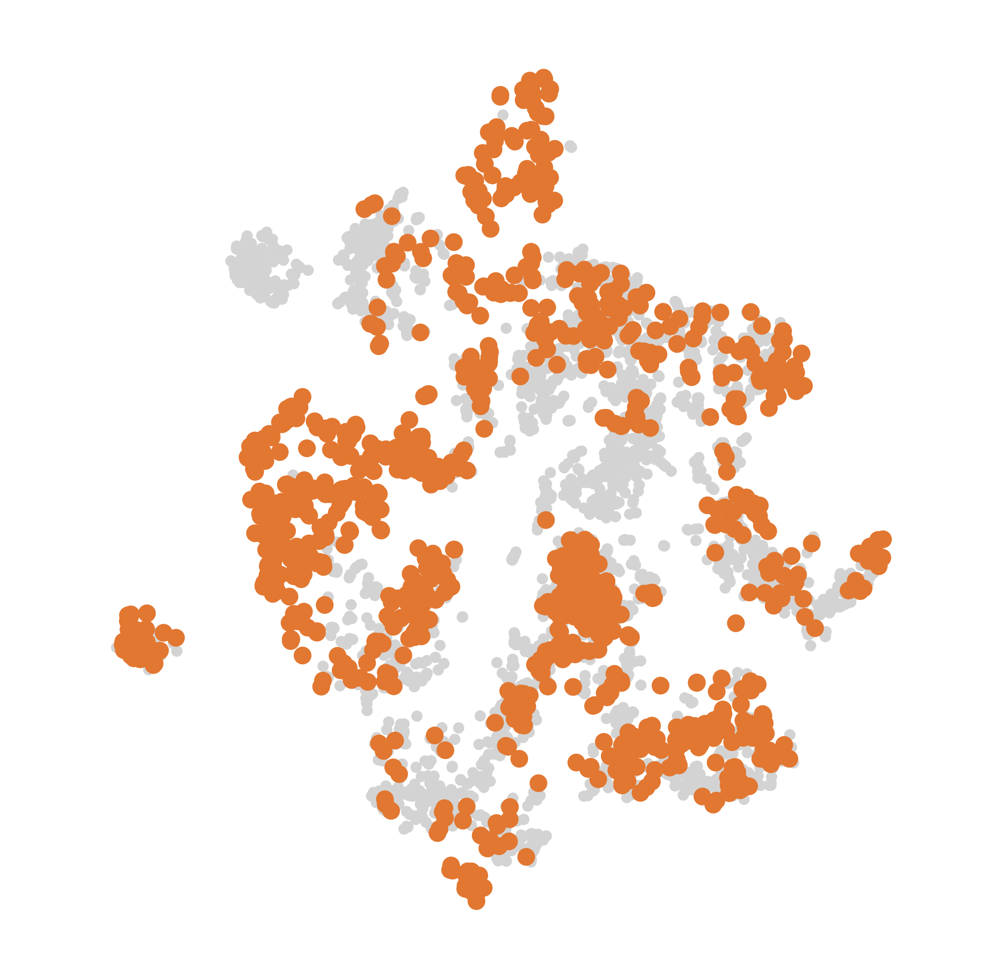

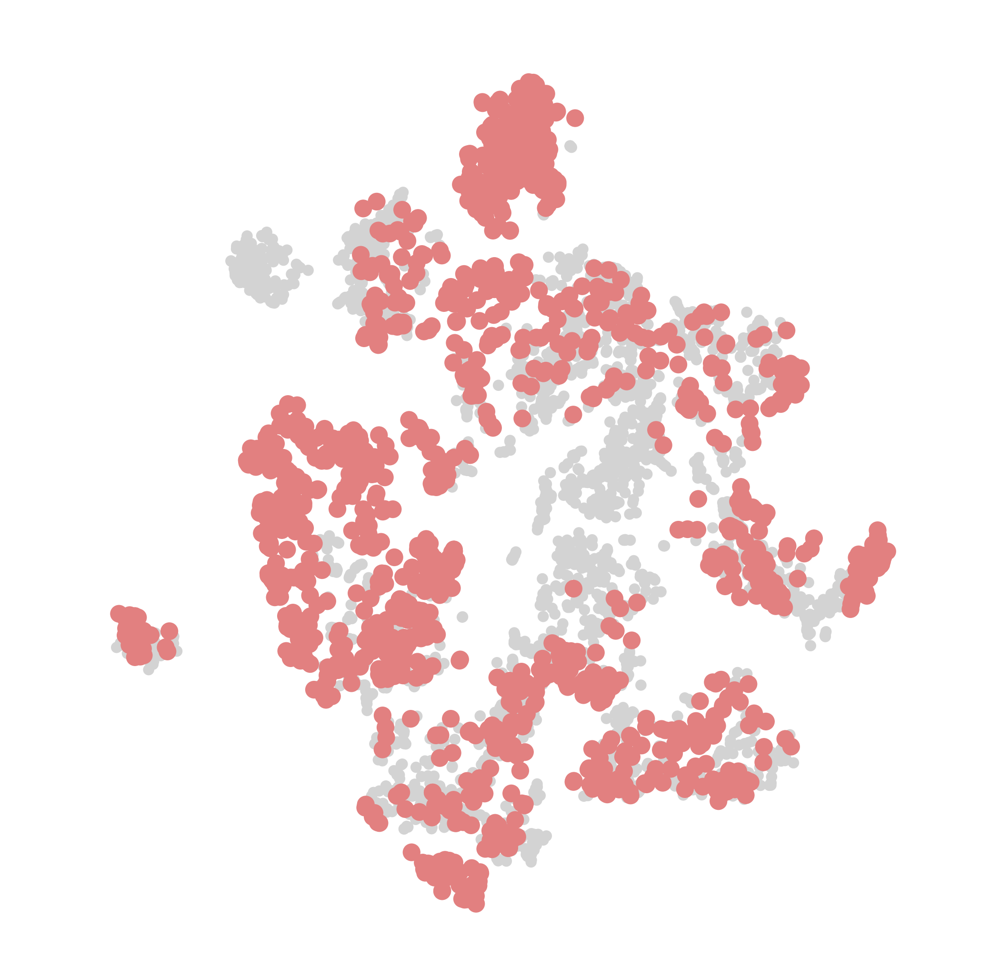

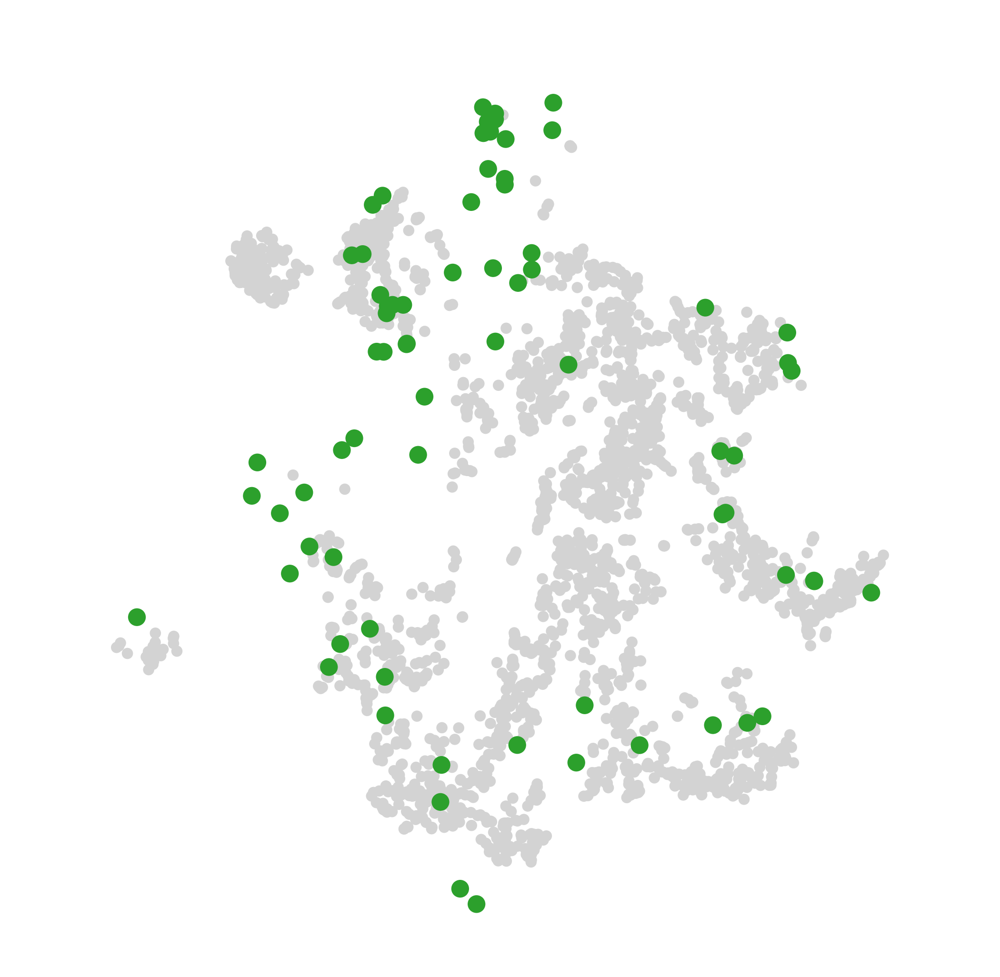

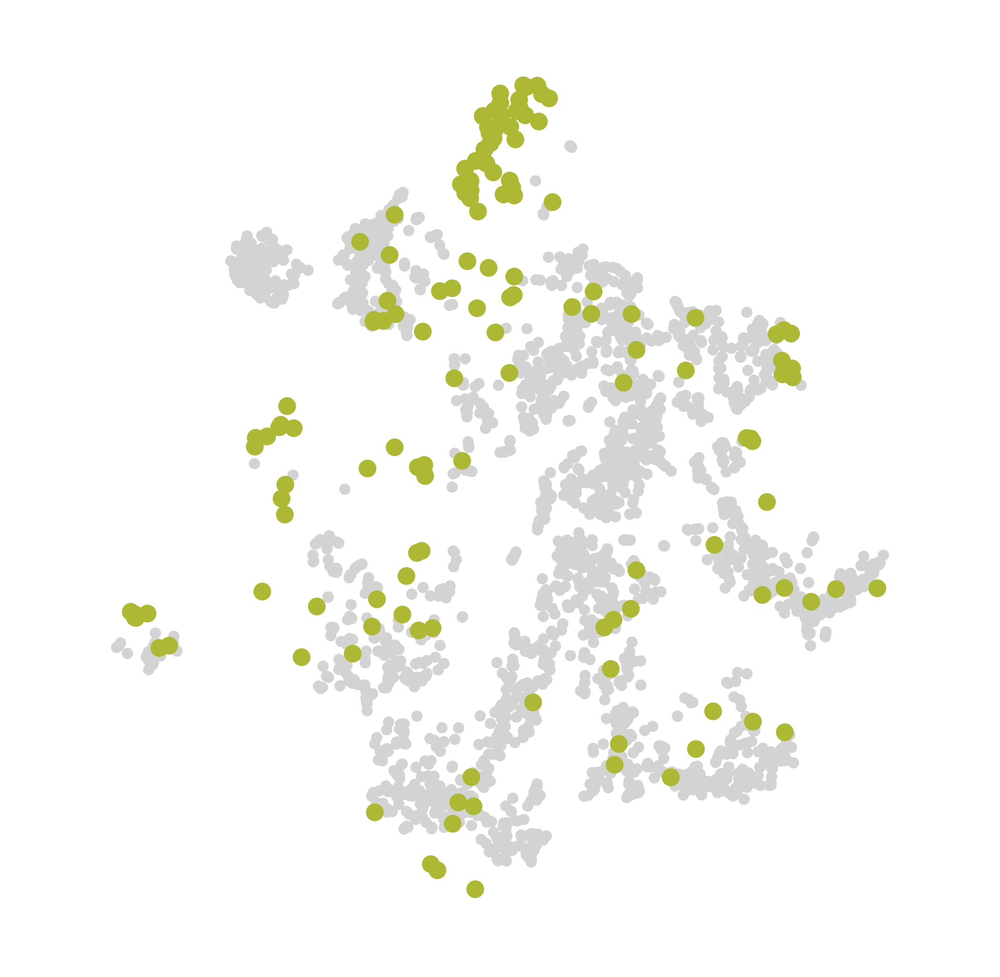

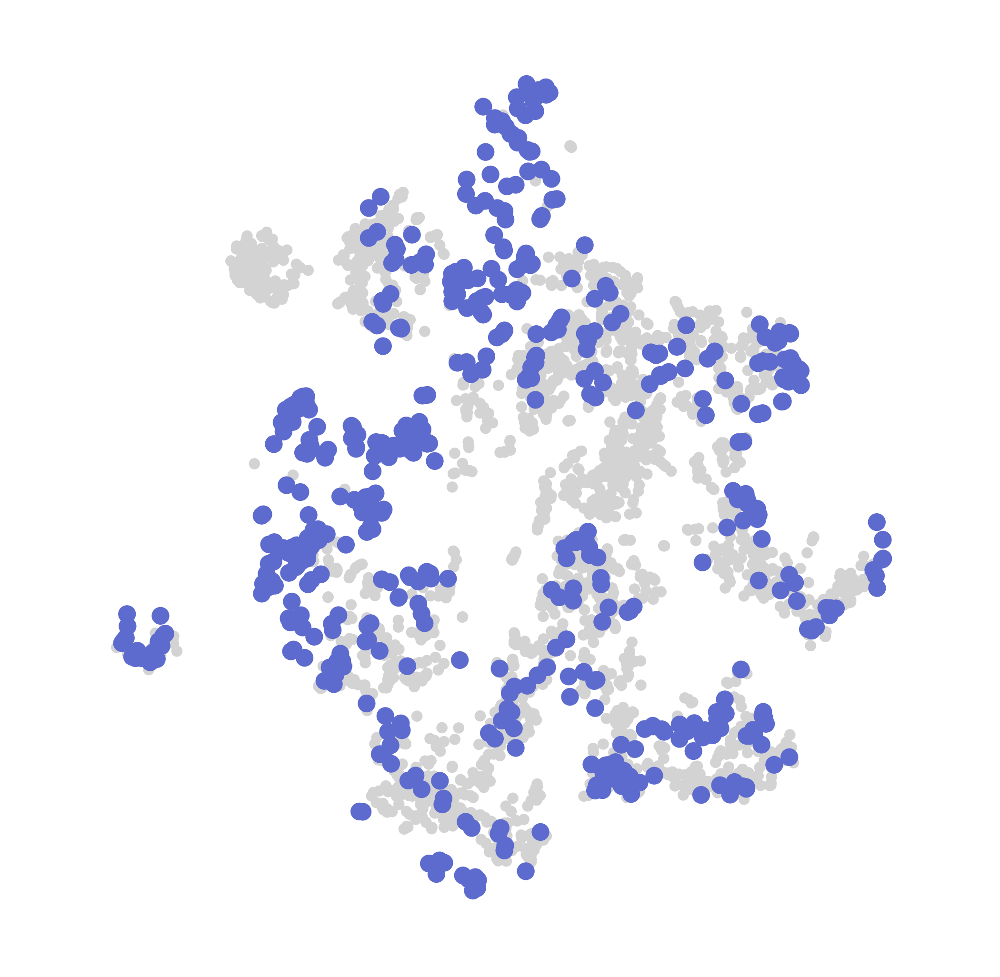

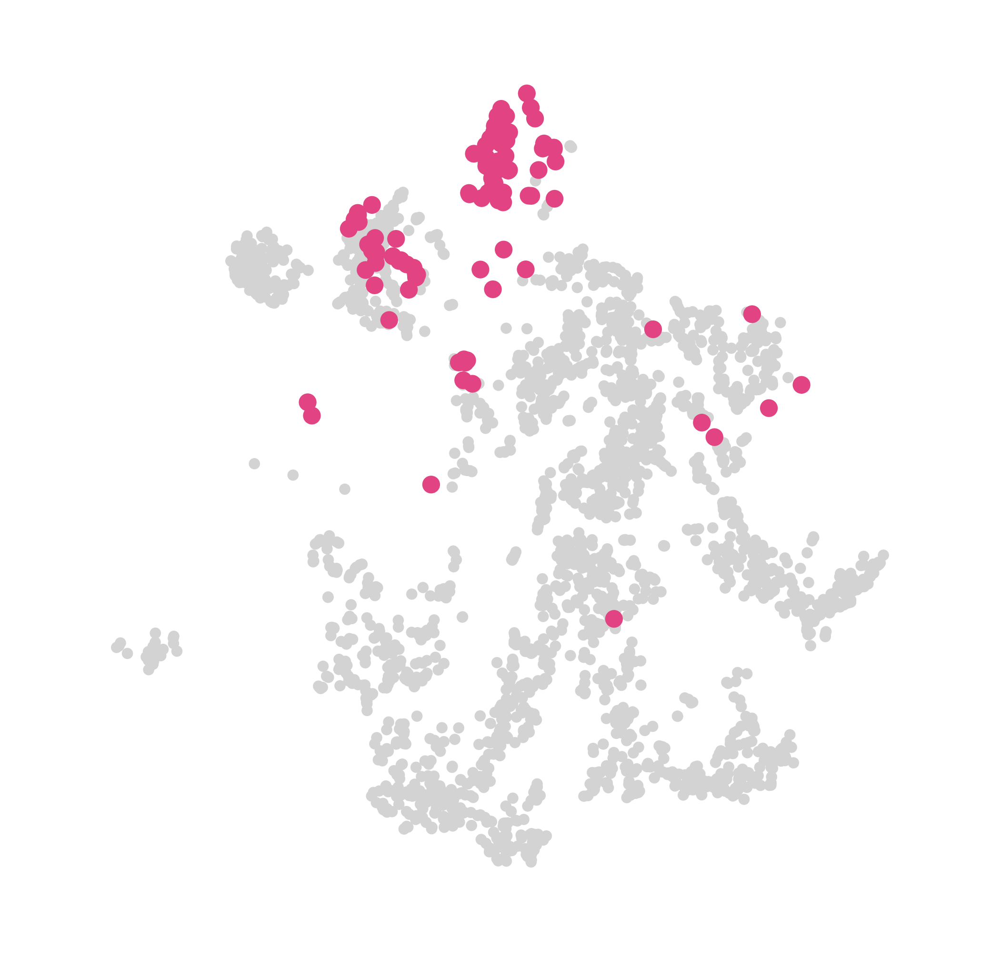

In [85]:
for target, sub_df in rs2_tidy_data.groupby('target'):
    fig, ax = plt.subplots(figsize=(2, 2), dpi=1200)
    categorical_scatter(ax=ax, data=mc_tidy_data, coord_base='rs1rs2tsne', 
                        hue=None, scatter_kws=dict(color='lightgray'),
                        max_points=None, s=1, axis_format=None)
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    categorical_scatter(ax=ax, data=sub_df, coord_base='rs1rs2tsne',
                        hue='target', palette=target_palette, #show_legend=True,
                        max_points=None, s=5, axis_format=None)
    ax.set(xlim=xlim, ylim=ylim)
    fig.savefig(f'RS2.target.{target}.png')
pass

181


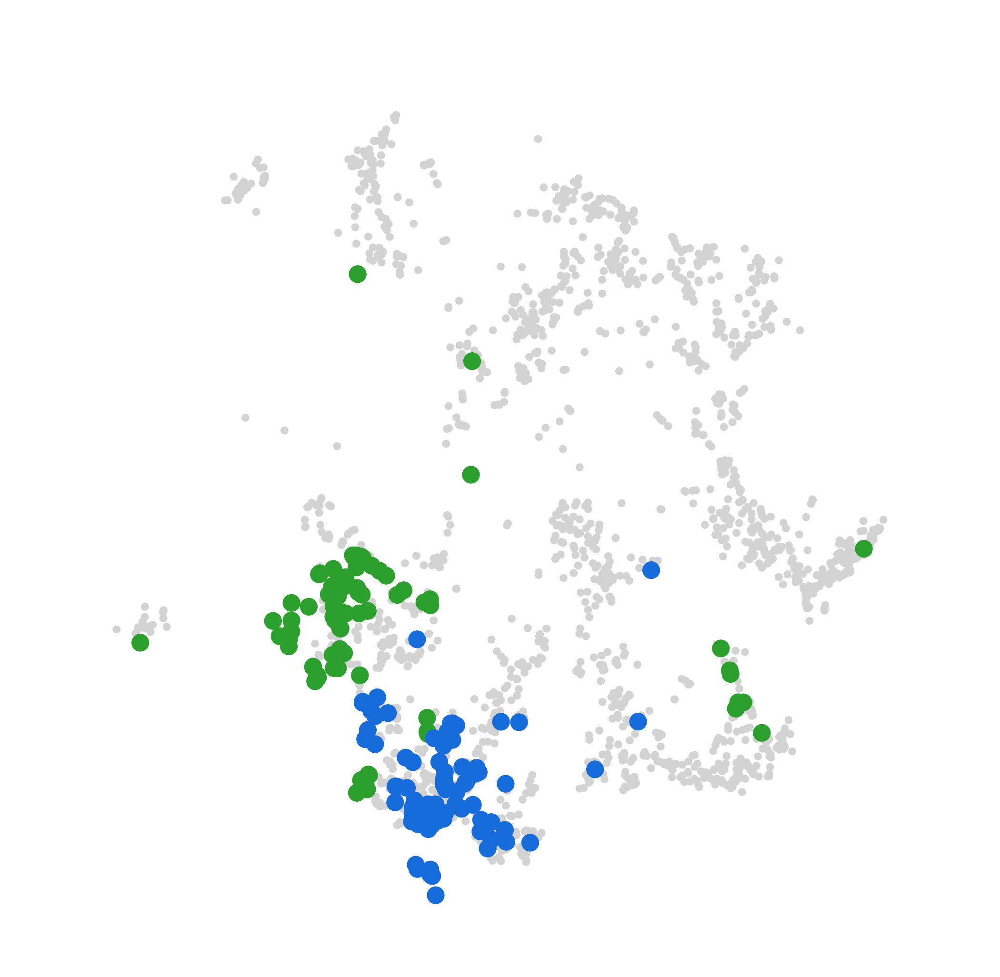

In [106]:
fig, ax = plt.subplots(figsize=(2, 2), dpi=1200)
categorical_scatter(ax=ax, data=mc_tidy_data.loc[rs1_use_cell], coord_base='rs1rs2tsne', 
                    hue=None, scatter_kws=dict(color='lightgray'),
                    max_points=None, s=1, axis_format=None)
xlim = ax.get_xlim()
ylim = ax.get_ylim()
print((rs2_tidy_data['target'] == 'MY').sum())
categorical_scatter(ax=ax, data=rs2_tidy_data[rs2_tidy_data['target'] == 'MY'], 
                    coord_base='rs1rs2tsne',
                    hue='source', palette=source_palette, #show_legend=True,
                    max_points=None, s=5, axis_format=None)
ax.set(xlim=xlim, ylim=ylim)
fig.savefig('RS2.to_my.color_by_source.png')

,source,slice,target,gender,cluster,non-clonal reads,leiden,rs1rs2umap_0,rs1rs2umap_1,rs1rs2tsne_0,rs1rs2tsne_1
RS2_3523,MOp,4B,MY,male,L5-ET,2329424,0,1.800161,-8.268633,-7.574917,-31.917784
RS2_3524,MOp,3C,MY,male,L5-ET,2606874,0,0.378487,-8.340027,-4.738554,-29.946152
RS2_3525,SSp,7B,MY,male,L5-ET,1504676,0,2.066744,-4.886851,-19.353771,-31.239289
RS2_3526,MOp,3C,MY,male,L5-ET,1683011,0,1.181069,-8.148371,-6.841074,-29.428790
RS2_3527,MOp,3C,MY,male,L5-ET,2933533,0,1.690975,-7.109938,-13.938669,-31.497503
RS2_3528,SSp,7B,MY,male,L5-ET,1948980,2,-0.169328,-3.785800,-23.268627,-14.449983
RS2_3529,SSp,7B,MY,female,L5-ET,2556154,6,1.986037,-3.540724,-31.083711,-14.937330
RS2_3530,SSp,7B,MY,male,L5-ET,2739104,2,-0.201714,-4.077785,-23.138846,-14.865263
RS2_3531,MOp,3C,MY,male,L5-ET,1261654,0,0.795809,-6.354540,-8.307933,-25.523786
RS2_3532,SSp,7B,MY,male,L5-ET,1114072,2,0.926862,-3.207522,-23.372775,-9.776275


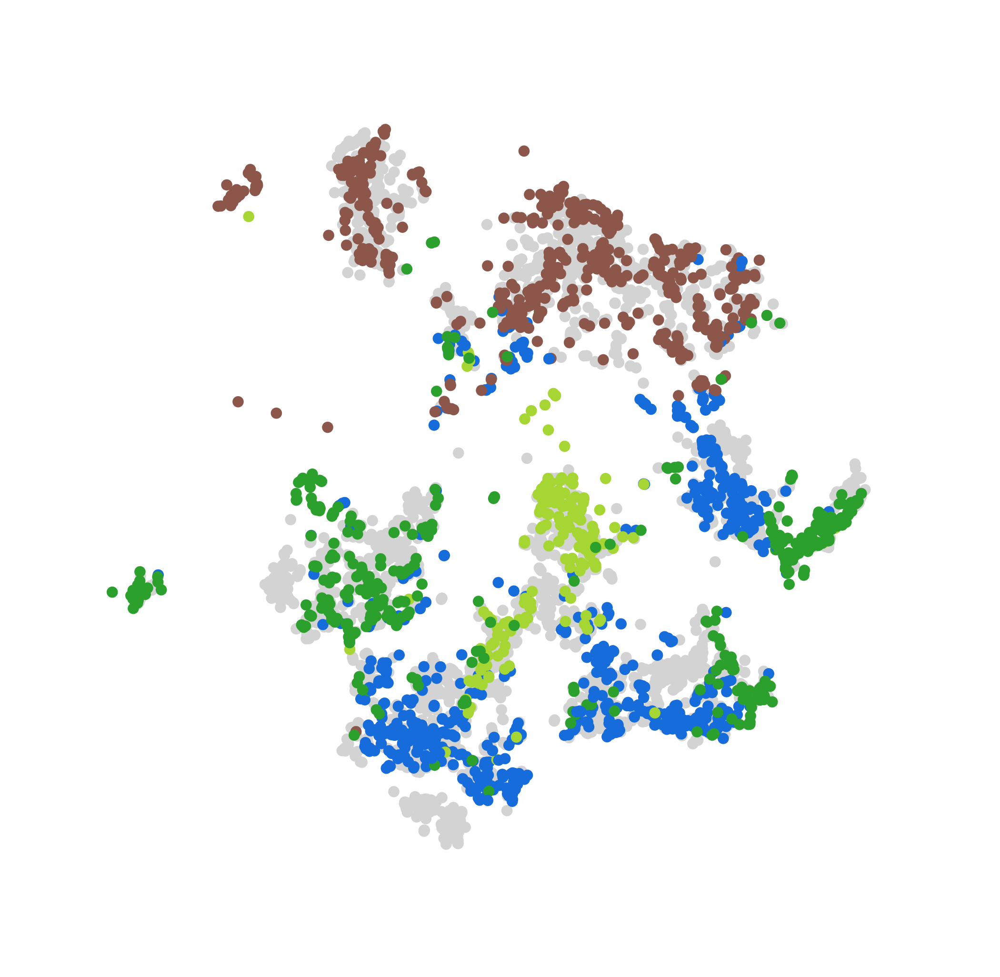

In [93]:
fig, ax = plt.subplots(figsize=(2, 2), dpi=1200)

use_cell = mc_tidy_data['SubRegion'].isin(['MOs', 'MOp', 
                                'AI', 'ACA', 'SSp', 'SSs'])

categorical_scatter(ax=ax, data=rs2_tidy_data.loc[rs2_use_cell], coord_base='rs1rs2tsne', 
                    hue=None, scatter_kws=dict(color='lightgray'),
                    max_points=None, s=2, axis_format=None)

categorical_scatter(ax=ax, data=mc_tidy_data.loc[rs1_use_cell], coord_base='rs1rs2tsne', 
                    hue='SubRegion', palette=sub_region_palette,
                    max_points=None, s=2, axis_format=None)
fig.savefig(f'RS1.source.only_both.png')
pass

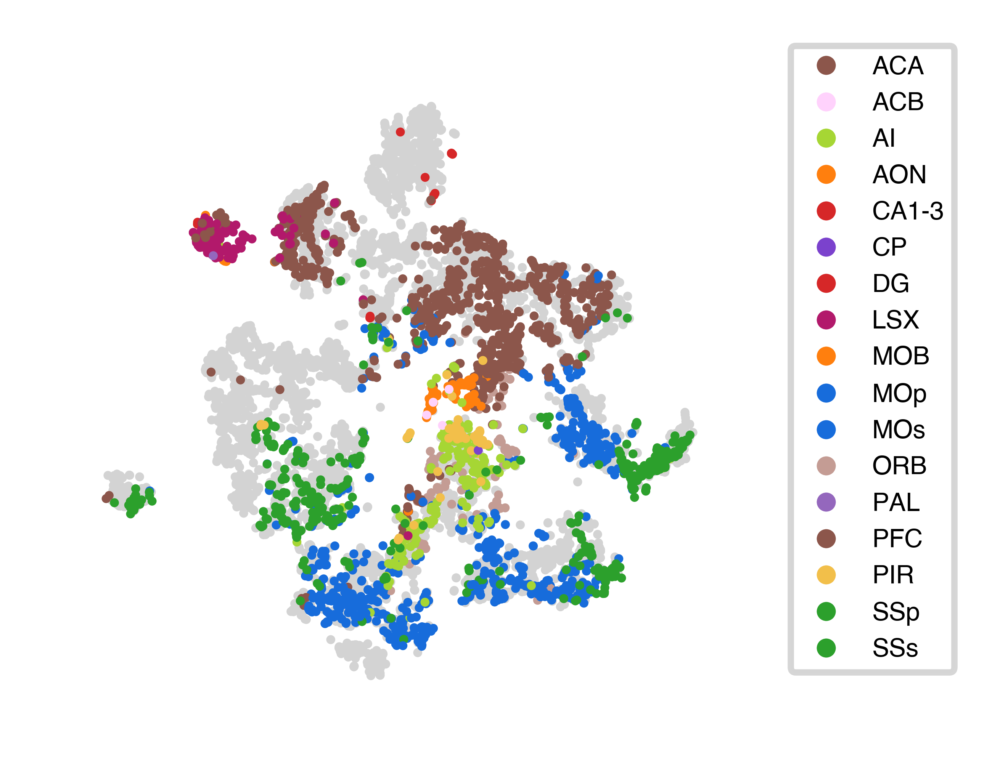

In [131]:
fig, ax = plt.subplots(figsize=(2, 2), dpi=1200)

use_cell = mc_tidy_data['SubRegion'].isin(['MOs', 'MOp', 
                                'AI', 'ACA', 'SSp', 'SSs'])

categorical_scatter(ax=ax, data=rs2_tidy_data, coord_base='rs1rs2tsne', 
                    hue=None, scatter_kws=dict(color='lightgray'),
                    max_points=None, s=2, axis_format=None)

categorical_scatter(ax=ax, data=mc_tidy_data, coord_base='rs1rs2tsne', 
                    hue='SubRegion', palette=sub_region_palette, show_legend=True,
                    max_points=None, s=2, axis_format=None)
fig.savefig(f'RS1.source.pdf')
pass

In [132]:
mc_tidy_data.shape, rs2_tidy_data.shape

((2637, 59), (4176, 12))

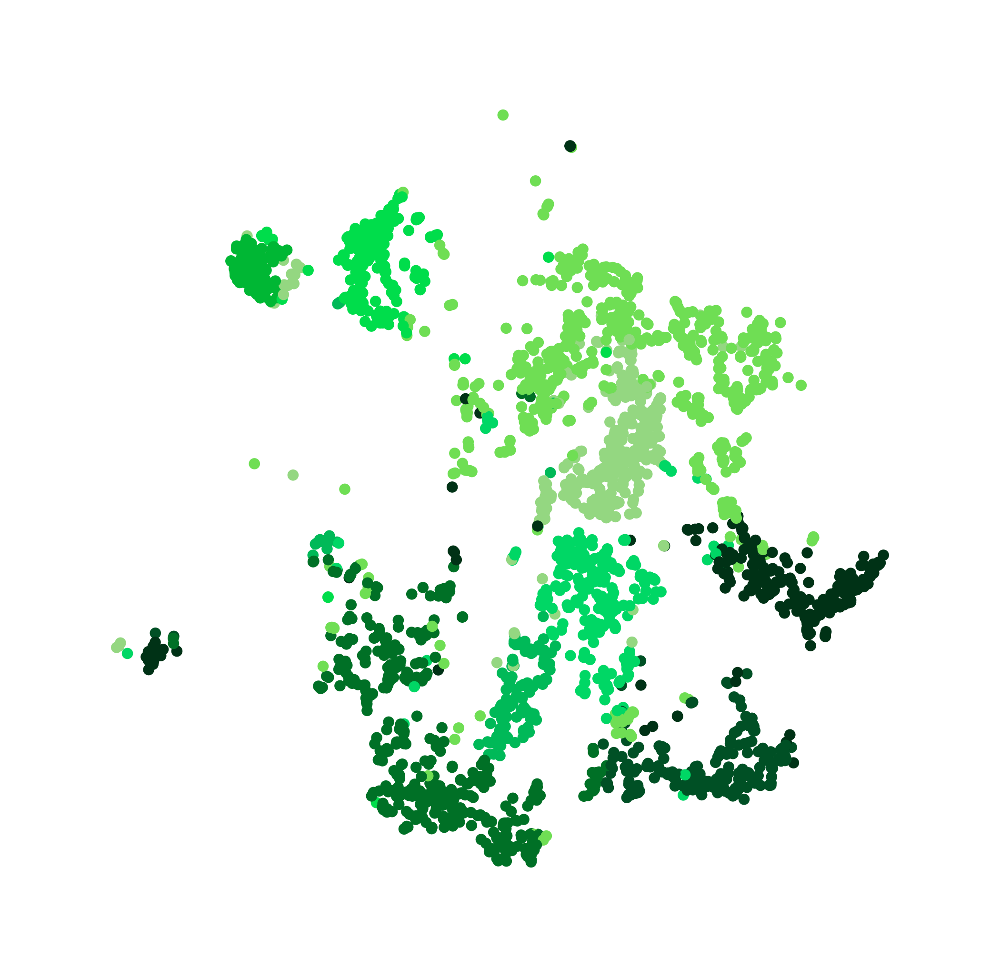

In [127]:
fig, ax = plt.subplots(figsize=(2, 2), dpi=1200)

# categorical_scatter(ax=ax,
#                     data=rs2_tidy_data,
#                     coord_base='rs1rs2tsne',
#                     hue=None,
#                     scatter_kws=dict(color='lightgray'),
#                     max_points=None,
#                     s=2,
#                     axis_format=None)
# 
categorical_scatter(
    ax=ax,
    data=mc_tidy_data[
        mc_tidy_data['SubType'].apply(lambda i: 'Outlier' not in i)],
    coord_base='rs1rs2tsne',
    hue='SubType',
    palette=sub_type_palette,
    # text_anno='SubType',
    max_points=None,
    s=2,
    axis_format=None)
fig.savefig(f'RS1.subtype.nobg.png')
pass

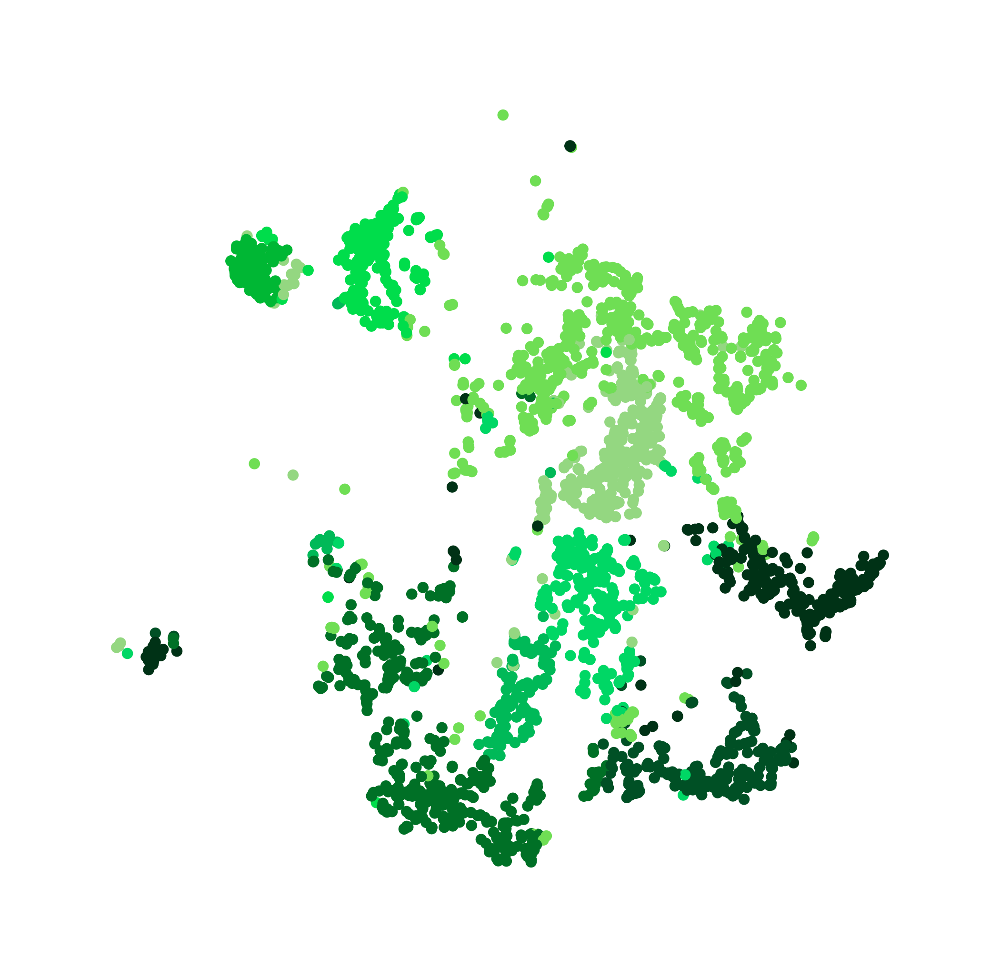

In [127]:
fig, ax = plt.subplots(figsize=(2, 2), dpi=1200)

# categorical_scatter(ax=ax,
#                     data=rs2_tidy_data,
#                     coord_base='rs1rs2tsne',
#                     hue=None,
#                     scatter_kws=dict(color='lightgray'),
#                     max_points=None,
#                     s=2,
#                     axis_format=None)
# 
categorical_scatter(
    ax=ax,
    data=mc_tidy_data[
        mc_tidy_data['SubType'].apply(lambda i: 'Outlier' not in i)],
    coord_base='rs1rs2tsne',
    hue='SubType',
    palette=sub_type_palette,
    # text_anno='SubType',
    max_points=None,
    s=2,
    axis_format=None)
fig.savefig(f'RS1.subtype.nobg.png')
pass

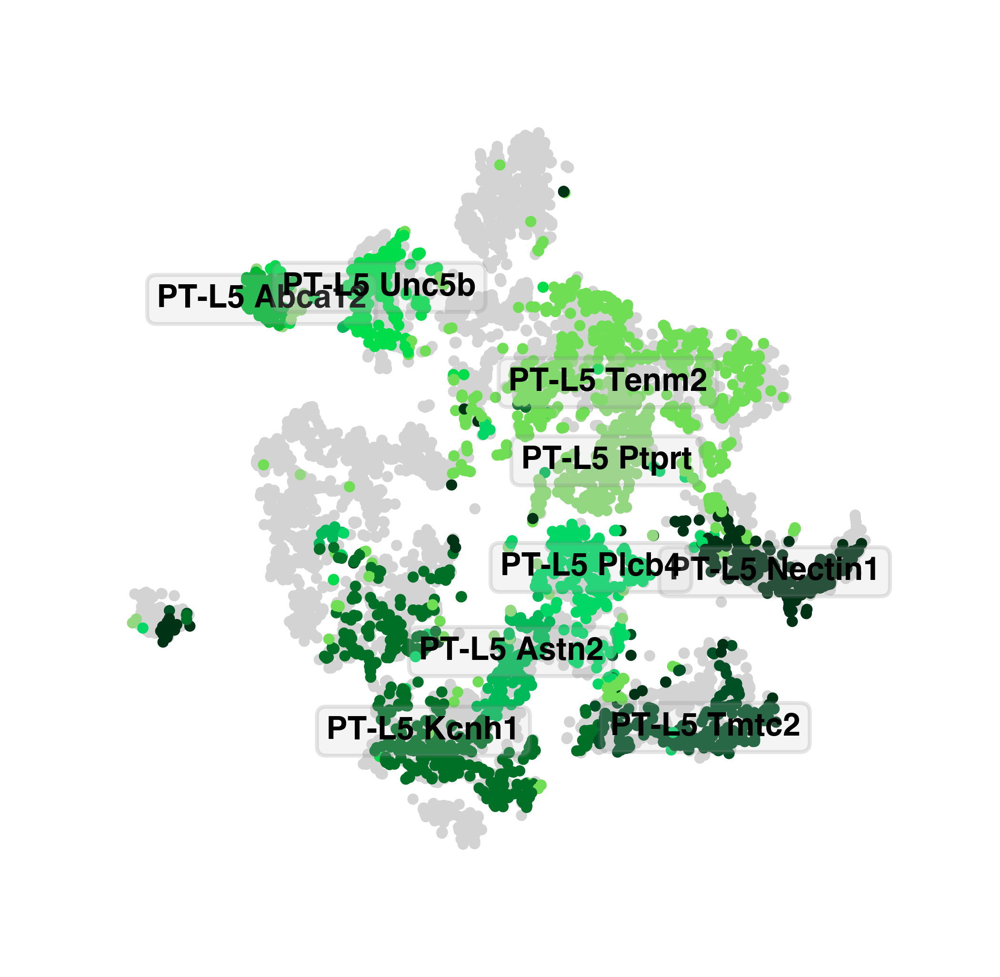

In [105]:
fig, ax = plt.subplots(figsize=(2, 2), dpi=1200)

categorical_scatter(ax=ax,
                    data=rs2_tidy_data,
                    coord_base='rs1rs2tsne',
                    hue=None,
                    scatter_kws=dict(color='lightgray'),
                    max_points=None,
                    s=2,
                    axis_format=None)

categorical_scatter(
    ax=ax,
    data=mc_tidy_data[
        mc_tidy_data['SubType'].apply(lambda i: 'Outlier' not in i)],
    coord_base='rs1rs2tsne',
    hue='SubType',
    palette=sub_type_palette,
    text_anno='SubType',
    max_points=None,
    s=2,
    axis_format=None)
pass

In [59]:
from cemba_data.tools.integration.utilities import calculate_direct_confusion

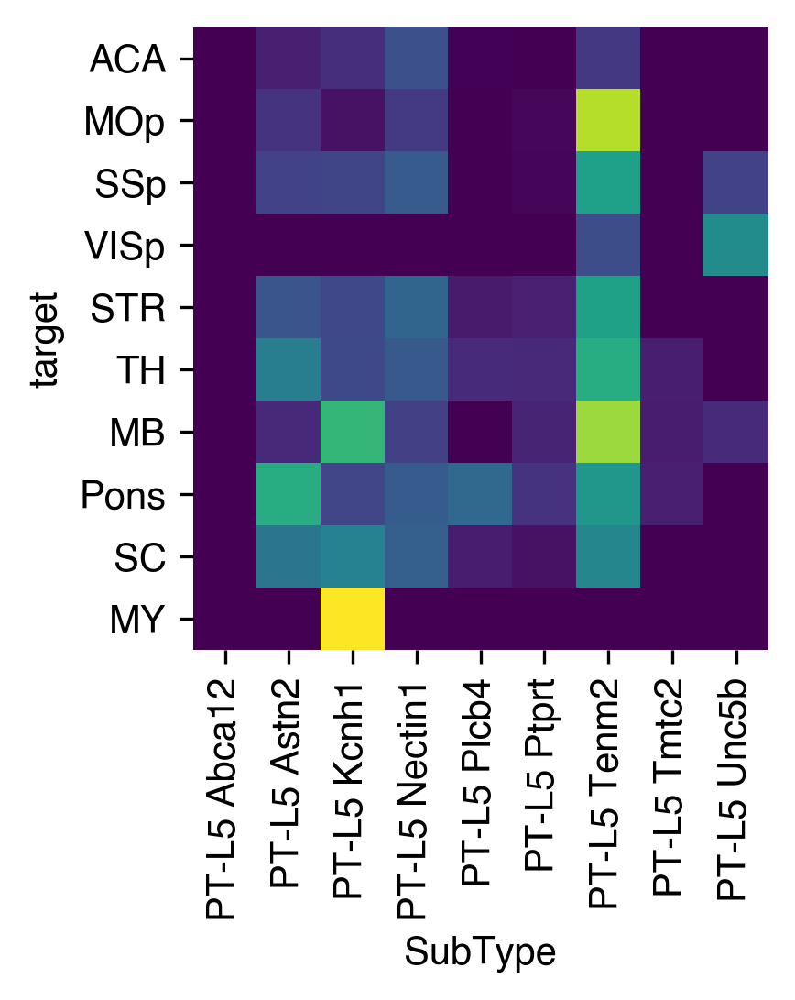

In [163]:
fig, ax = plt.subplots(figsize=(2.7, 3), dpi=300)
cfm = calculate_direct_confusion(
    mc_tidy_data[['SubType', 'leiden']], 
    rs2_tidy_data[['target', 'leiden']]
)

col_order = [
    'ACA', 'MOp', 'SSp', 'VISp', 'STR', 'TH', 'MB', 'Pons', 'SC', 'MY'
]
row_order = [
    'PT-L5 Abca12', 'PT-L5 Astn2', 'PT-L5 Kcnh1', 'PT-L5 Nectin1',
    'PT-L5 Plcb4', 'PT-L5 Ptprt', 'PT-L5 Tenm2', 'PT-L5 Tmtc2', 'PT-L5 Unc5b'
]

sns.heatmap(cfm.loc[row_order, col_order].T, vmin=0.1, vmax=0.5, cbar=False, cmap='viridis')
fig.savefig('RS1_Subtype.OS_with_target.pdf')

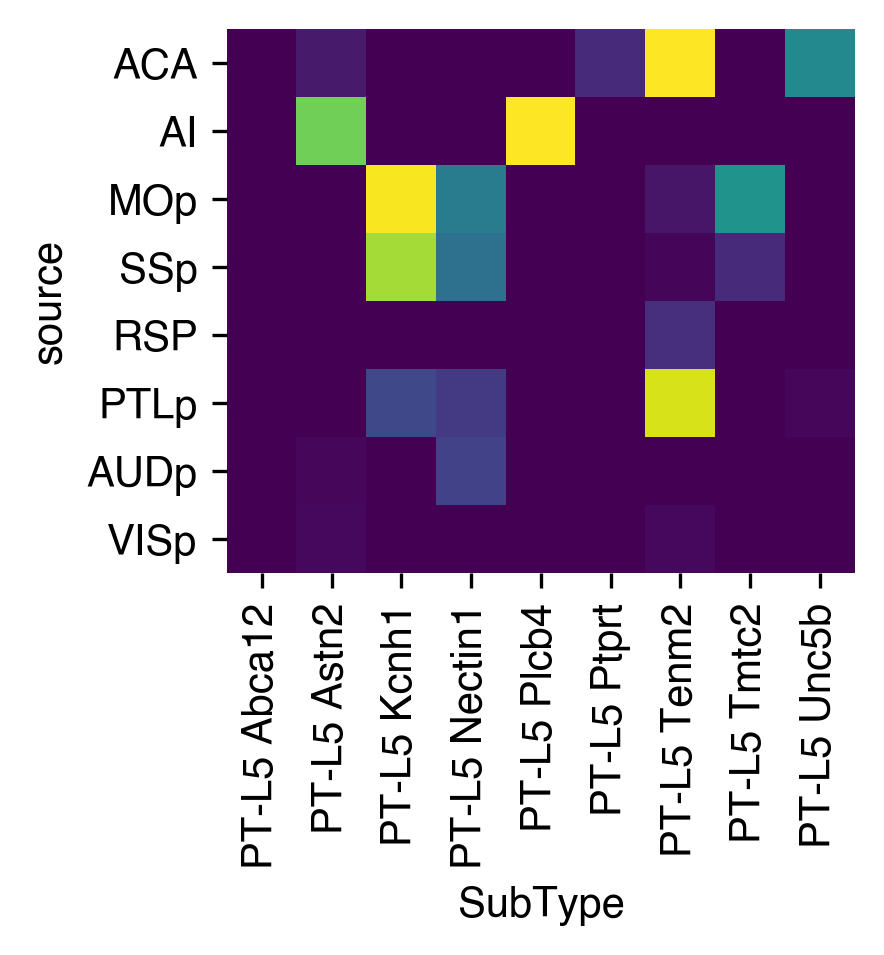

In [162]:
fig, ax = plt.subplots(figsize=(2.7, 2.4), dpi=300)
cfm = calculate_direct_confusion(
    mc_tidy_data[['SubType', 'leiden']], 
    rs2_tidy_data[['source', 'leiden']]
)

col_order = [
    'ACA', 'AI', 'MOp', 'SSp', 'RSP', 'PTLp', 'AUDp', 'VISp'
]
row_order = [
    'PT-L5 Abca12', 'PT-L5 Astn2', 'PT-L5 Kcnh1', 'PT-L5 Nectin1',
    'PT-L5 Plcb4', 'PT-L5 Ptprt', 'PT-L5 Tenm2', 'PT-L5 Tmtc2', 'PT-L5 Unc5b'
]

sns.heatmap(cfm.loc[row_order, col_order].T, vmin=0.1, vmax=0.5, cbar=False, cmap='viridis')

fig.savefig('RS1_Subtype.OS_with_source.pdf')